In [1]:
import os

os.environ["JAX_PLATFORM_NAME"]="cpu"

os.environ['OPENBLAS_NUM_THREADS'] = '1'
os.environ['MKL_NUM_THREADS'] = '1'

os.environ["NUM_INTER_THREADS"]="1"
os.environ["NUM_INTRA_THREADS"]="1"

os.environ["XLA_FLAGS"] = ("--xla_cpu_multi_thread_eigen=false "
                           "intra_op_parallelism_threads=1")

In [2]:
import mellon
import jax

jax.config.update("jax_enable_x64", False)

In [3]:
import os
from threadpoolctl import threadpool_info, threadpool_limits
import numpy as np
from scipy.special import expit
from scipy.stats import gaussian_kde
from sklearn import preprocessing
from sklearn.gaussian_process.kernels import Matern
from sklearn.datasets import make_spd_matrix
from sklearn.neighbors import NearestNeighbors
from scipy.stats import multivariate_normal
import pandas as pd
from tqdm.auto import tqdm
import seaborn as sns
import multiprocess as mp

import plotnine as p9
import matplotlib.pyplot as plt

from anndata import read_h5ad, AnnData
import scanpy as sc
import harmony

In [4]:
import matplotlib

%matplotlib inline
matplotlib.rcParams["figure.dpi"] = 150  # 150 dpi resolution
matplotlib.rcParams["image.cmap"] = "Spectral_r"  # preferred color map
matplotlib.rcParams["figure.figsize"] = [6, 6]  # Square
# no bounding boxes or axis:
matplotlib.rcParams["axes.spines.bottom"] = "off"
matplotlib.rcParams["axes.spines.top"] = "off"
matplotlib.rcParams["axes.spines.left"] = "off"
matplotlib.rcParams["axes.spines.right"] = "off"
pd.set_option("display.max_columns", 1000)

# Dataset specifications

In [5]:
n_dim = 15
random_seed = 76945
dens_decay = .9
var_decay = 1.5
curvature = .2
sample_res = int(51e3)
n_samples = (5*sample_res, [
    (10*sample_res, [
        (3*sample_res, [
             (10*sample_res, []), (6*sample_res, [(20*sample_res, []),]),
        ]),
        (1*sample_res, [
            (7*sample_res, [(2*sample_res, [(10*sample_res, [(1*sample_res, [(7*sample_res, []),]),]),]),]),
        ]),
    ]),
    (6*sample_res, [
        (5*sample_res, []), (8*sample_res, [(12*sample_res, []), (5*sample_res, []), ]),
    ]),
])

# Simulation

In [6]:
%%time
np.random.seed(random_seed)


def sample_branch(
    base,
    velocity,
    sample_struck,
    curvature=0.5,
    var_decay=1,
    dens_decay=1,
    n_dim=10,
    branch_name="b",
):
    n_draws, sub_struck = sample_struck
    scale = np.sqrt(np.sum(velocity**2))
    delta = np.random.normal(0, scale, n_dim)
    new_velo = (velocity * (1 - curvature) + delta * curvature) * dens_decay
    mu = base + (new_velo / 2)
    q, r = np.linalg.qr(new_velo[:, None], mode="complete")
    mr = 5e-1 * np.exp(-np.arange(n_dim) * var_decay / 2) * np.abs(r[0])
    mr = np.clip(mr, 1e-4 * np.abs(r[0]), None)
    bases = q * mr[None, :]
    cov = bases.dot(bases.T)
    dist = multivariate_normal(mu, cov)
    samples = dist.rvs(n_draws)
    samp_list, dist_list, draws_list = (
        [
            samples,
        ],
        [
            dist,
        ],
        [
            n_draws,
        ],
    )
    name_list = [
        np.repeat(branch_name, n_draws),
    ]
    new_base = base + new_velo
    for i, ss in enumerate(sub_struck):
        samples, dist, n_draws, names = sample_branch(
            new_base,
            new_velo,
            ss,
            curvature=curvature,
            var_decay=var_decay,
            n_dim=n_dim,
            branch_name=f"{branch_name}-{i}",
        )
        samp_list += samples
        dist_list += dist
        draws_list += n_draws
        name_list += names
    return samp_list, dist_list, draws_list, name_list


sample_list, distributions, draws_list, name_list = sample_branch(
    np.zeros(n_dim),
    np.ones(n_dim),
    n_samples,
    n_dim=n_dim,
    dens_decay=dens_decay,
    var_decay=var_decay,
    curvature=curvature,
)

samples = np.concatenate(sample_list, axis=0)
n_draws = np.array(draws_list)
total_samples = np.sum(n_draws)
print(f"Total samples = {total_samples:,}")
weigts = n_draws / total_samples
pdf = np.zeros(np.sum(n_draws))
for w, dist in zip(weigts, distributions):
    pdf += w * dist.pdf(samples)

Total samples = 6,018,000
CPU times: user 12.9 s, sys: 7.57 s, total: 20.5 s
Wall time: 20.5 s


In [7]:
sim_ad = AnnData(
    samples,
    obs=pd.DataFrame(
        {
            "ground_truth": pdf,
            "log_ground_truth": np.log10(pdf),
            "branch_name": np.concatenate(name_list, axis=0),
        },
        index=range(np.sum(n_draws)),
    ),
)
sim_ad.obs["branch_name"] = sim_ad.obs["branch_name"].astype("category")

if sim_ad.X.shape[1] == 2:
    df = sim_ad.obs.copy()
    df["x"] = sim_ad.X[:, 0]
    df["y"] = sim_ad.X[:, 1]
    pl = p9.ggplot(df, p9.aes("x", "y", color="branch_name")) + p9.geom_point()
    print(pl)

/fh/fast/setty_m/user/dotto/mamba/envs/mellon_v2/lib/python3.10/site-packages/anndata/_core/anndata.py:117: ImplicitModificationWarning: Transforming to str index.


# Density inference

In [8]:
%%time
est = mellon.DensityEstimator(d=3)
log_density = est.fit_predict(sim_ad.X)

[2023-06-16 21:32:54,043] [INFO    ] Computing nearest neighbor distances.
[2023-06-16 21:39:24,050] [INFO    ] Using covariance function Matern52(ls=3.171072244644165).
[2023-06-16 21:39:24,052] [INFO    ] Large number of 6,018,000 cells and small number of 5,000 landmarks. Consider computing k-means on a subset of cells and passing the results as 'landmarks' to speed up the process.
[2023-06-16 21:39:24,518] [INFO    ] Computing 5,000 landmarks with k-means clustering.
[2023-06-17 02:53:19,819] [INFO    ] Doing low-rank Cholesky decomposition for 6,018,000 samples and 5,000 landmarks.
[2023-06-17 03:33:00,375] [INFO    ] Estimating approximation accuracy since 6,018,000 samples are more than 10 x 5,000 landmarks.
[2023-06-17 05:21:28,063] [WARNING ] High approx. rank fraction (99.7%). Consider increasing 'n_landmarks'.
[2023-06-17 05:21:28,066] [INFO    ] Using rank 5,000 covariance representation.
[2023-06-17 05:37:58,241] [INFO    ] Running inference using L-BFGS-B.
CPU times: user

In [9]:
# samps3 = aprox2.sample(100)
# log_density3 = samps3['log_density'].mean(axis=0)
sim_ad.obs["log_density"] = log_density
sim_ad.obs["density"] = np.exp(sim_ad.obs["log_density"])

# Save Result

In [10]:
filename = "latentX_6M_single_core.h5ad"
#sim_ad.write(filename)
filepath = os.path.join(os.getcwd(), filename)
print(f'Saved at {filepath}')

Saved at /fh/fast/setty_m/user/dotto/simulated_datasets/tcelldepl_like_15d_v2/latentX_6M_single_core.h5ad


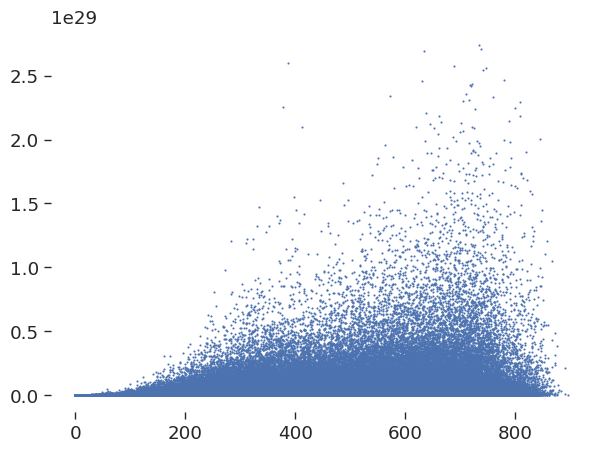

In [11]:
plt.rcParams["figure.dpi"] = 100
plt.rcParams["figure.figsize"] = (7, 5)
scp = plt.scatter(
    sim_ad.obs["density"],
    sim_ad.obs["ground_truth"] * sim_ad.n_obs,
    s=0.5,
)
# plt.colorbar(scp)
# plt.axis('off')

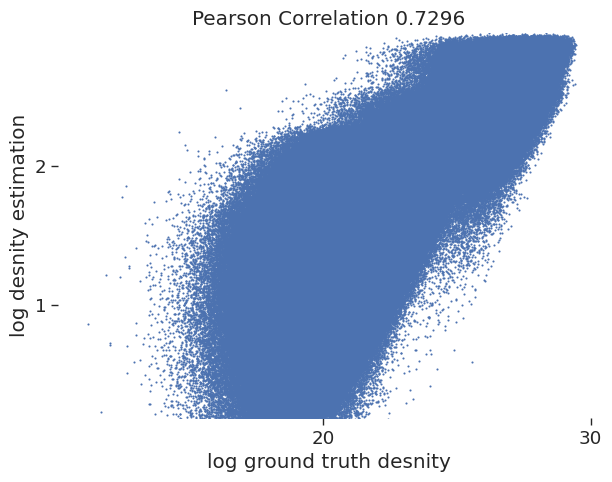

In [12]:
plt.rcParams["figure.dpi"] = 100
plt.rcParams["figure.figsize"] = (7, 5)
x = sim_ad.obs["log_density"] / np.log(10)
y = np.log10(sim_ad.obs["ground_truth"] * sim_ad.n_obs)
ccor = np.corrcoef(y, x)[1, 0]
scp = plt.scatter(y, x, s=0.5)
plt.locator_params(axis="x", nbins=3)
plt.locator_params(axis="y", nbins=3)
plt.ylim(*np.quantile(x, [0.002, 1]))
plt.ylabel("log desnity estimation")
plt.xlabel("log ground truth desnity")
# plt.colorbar(scp)
# plt.axis('off')
plt.title(f"Pearson Correlation {ccor:.4}");

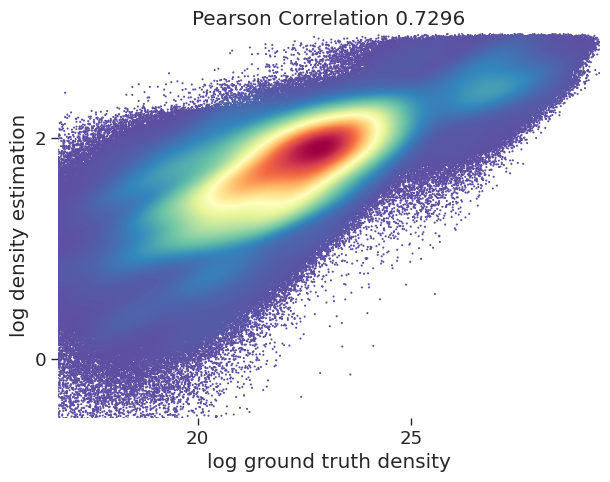

In [13]:
xy = np.vstack([np.ravel(x), np.ravel(y)])
idx = np.random.choice(xy.shape[1], size=500)
z = gaussian_kde(xy[:, idx])(xy)
i = np.argsort(z)
scp = plt.scatter(y[i], x[i], c=z[i], s=.5)
plt.locator_params(axis="x", nbins=3)
plt.locator_params(axis="y", nbins=3)
plt.ylim(*np.quantile(x, [.0002, 1]))
plt.xlim(*np.quantile(y, [0.002, 1]))
plt.ylabel('log density estimation')
plt.xlabel('log ground truth density')
#plt.colorbar(scp)
#plt.axis('on')
matplotlib.rcParams['axes.spines.bottom'] = "on"
matplotlib.rcParams['axes.spines.left'] = "on"
plt.title(f'Pearson Correlation {ccor:.4}')
plt.show()
matplotlib.rcParams['axes.spines.bottom'] = "off"
matplotlib.rcParams['axes.spines.left'] = "off"

# Other computations

In [14]:
%%time
sc.pp.neighbors(sim_ad, n_neighbors=30)
sc.tl.umap(sim_ad)
sc.tl.leiden(sim_ad)
sim_ad

/fh/fast/setty_m/user/dotto/mamba/envs/mellon_v2/lib/python3.10/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
/fh/fast/setty_m/user/dotto/mamba/envs/mellon_v2/lib/python3.10/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
/fh/fast/setty_m/user/dotto/mamba/envs/mellon_v2/lib/python3.10/site-pac

CPU times: user 21h 16min 18s, sys: 2h 29min 25s, total: 23h 45min 44s
Wall time: 21h 29min 3s


AnnData object with n_obs × n_vars = 6018000 × 15
    obs: 'ground_truth', 'log_ground_truth', 'branch_name', 'log_density', 'density', 'leiden'
    uns: 'neighbors', 'umap', 'leiden'
    obsm: 'X_umap'
    obsp: 'distances', 'connectivities'

# Vizualization

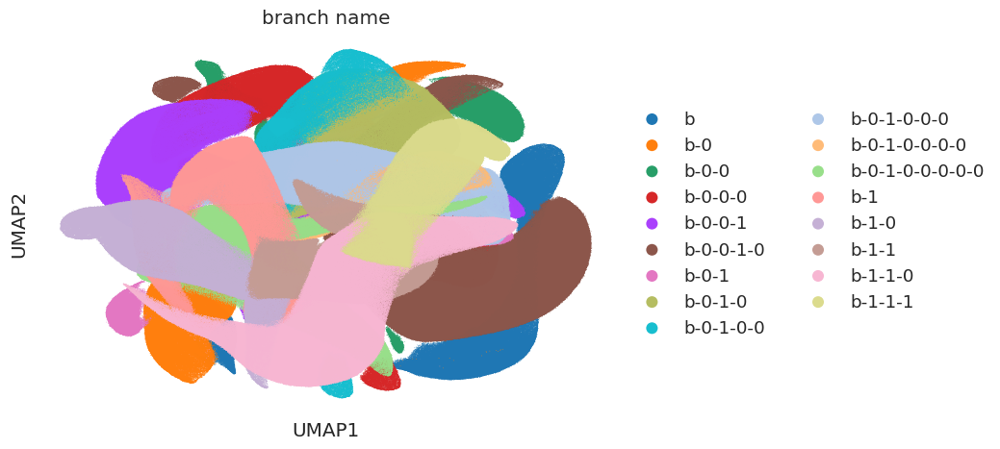

In [15]:
sc.pl.scatter(sim_ad, basis="umap", color=["branch_name"], size=1)

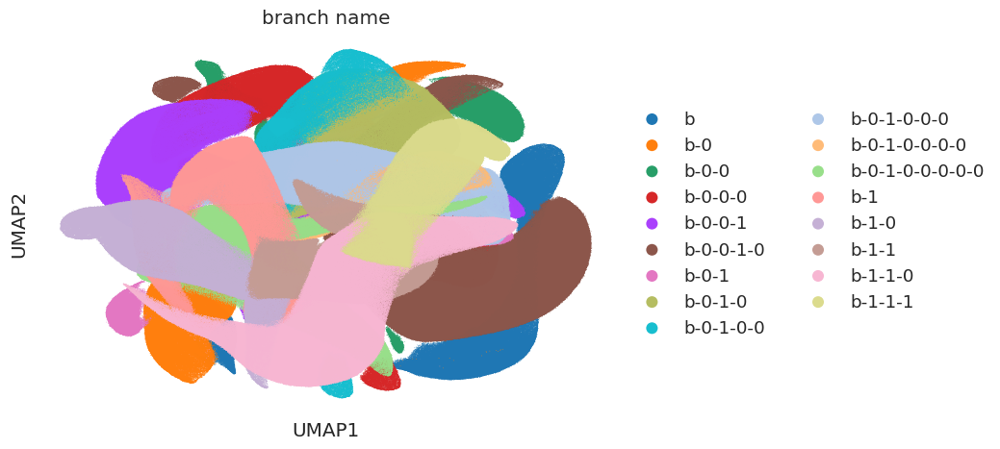

In [16]:
sc.pl.scatter(sim_ad, basis="umap", color=["branch_name"], size=1)

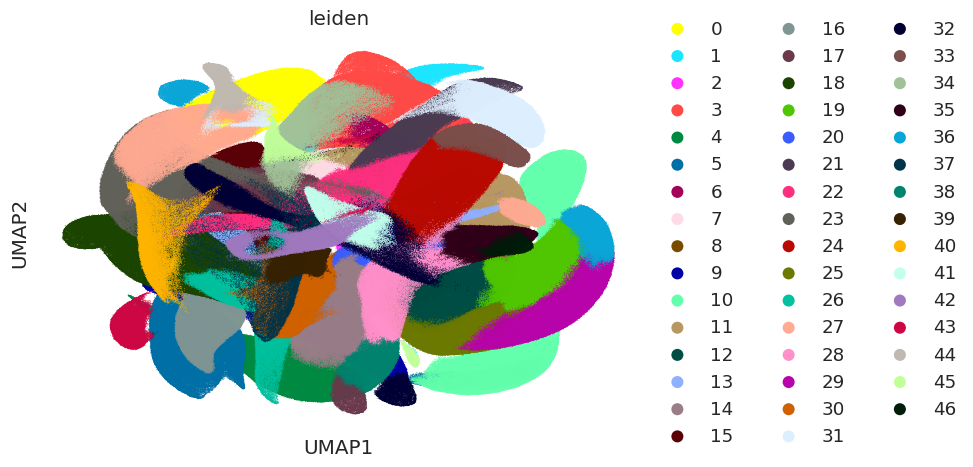

In [17]:
sc.pl.scatter(sim_ad, basis="umap", color=["leiden"], size=1)

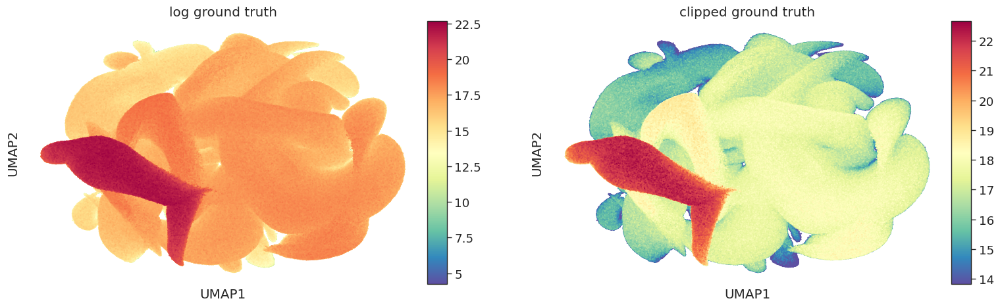

In [18]:
sim_ad.obs["clipped_ground_truth"] = np.clip(
    sim_ad.obs["log_ground_truth"],
    *np.quantile(sim_ad.obs["log_ground_truth"], [0.2, 1]),
)
sc.pl.scatter(
    sim_ad, basis="umap", color=["log_ground_truth", "clipped_ground_truth"], size=10
)

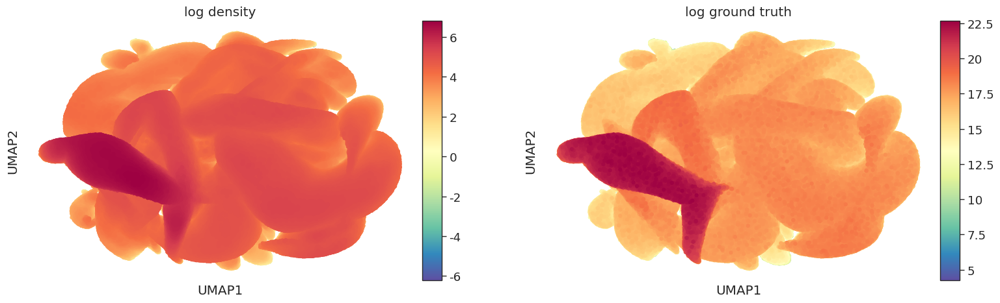

In [19]:
sc.pl.scatter(
    sim_ad,
    basis="umap",
    color=["log_density", "log_ground_truth"],
    color_map="Spectral_r",
    size=80,
)

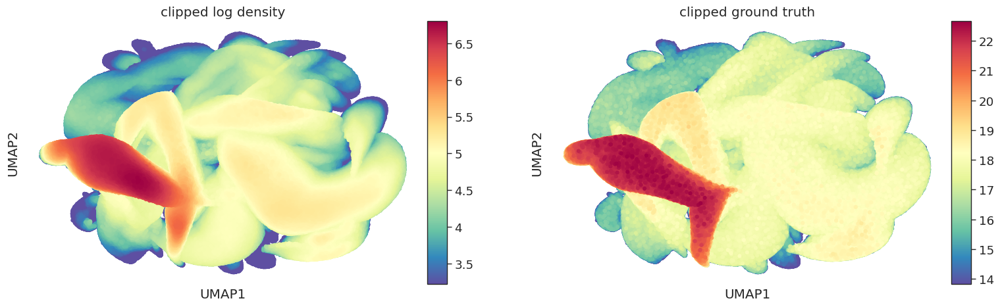

In [20]:
sim_ad.obs["clipped_log_density"] = np.clip(
    sim_ad.obs["log_density"],
    *np.quantile(sim_ad.obs["log_density"], [0.2, 1]),
)
sc.pl.scatter(
    sim_ad,
    basis="umap",
    color=["clipped_log_density", "clipped_ground_truth"],
    color_map="Spectral_r",
    size=80,
)

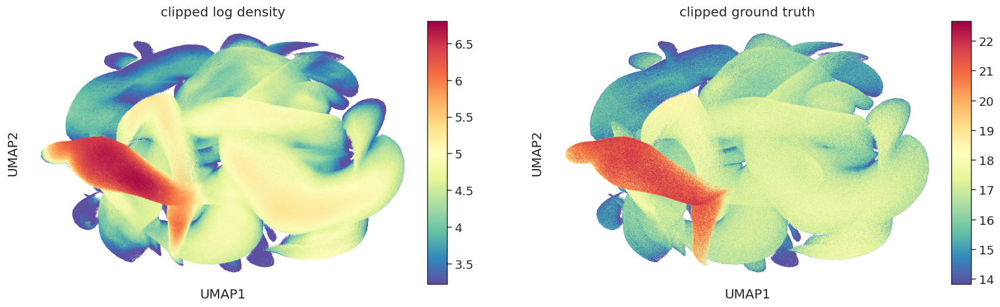

In [21]:
sc.pl.scatter(
    sim_ad,
    basis="umap",
    color=["clipped_log_density", "clipped_ground_truth"],
    color_map="Spectral_r",
    size=1,
)

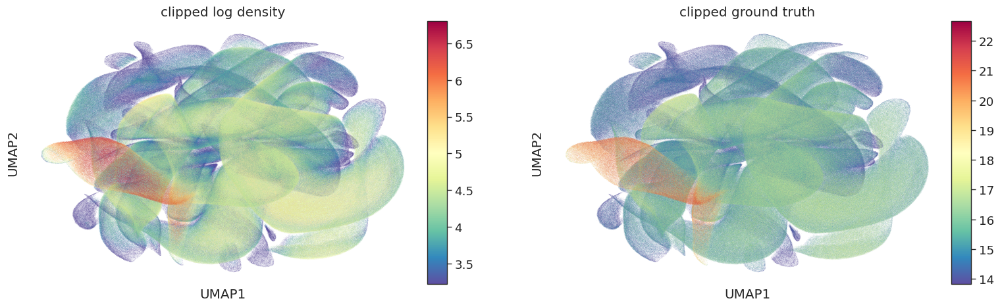

In [22]:
sc.pl.scatter(
    sim_ad,
    basis="umap",
    color=["clipped_log_density", "clipped_ground_truth"],
    color_map="Spectral_r",
    size=.1,
)

In [24]:
matplotlib.rcParams["figure.dpi"] = 300

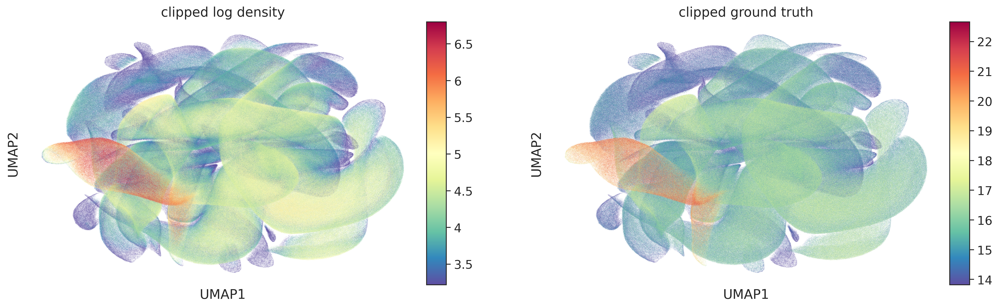

In [25]:
sc.pl.scatter(
    sim_ad,
    basis="umap",
    color=["clipped_log_density", "clipped_ground_truth"],
    color_map="Spectral_r",
    size=.1,
)